In [23]:
import numpy as np
%display latex
from scipy import constants


hbar = var('hb', latex_name=r'\hbar')
x, t = var('x', 't')
Psi = var('Psi')
A = var('A')
a = var('a')
m = var('m')
assume(A>0, a>0, hb>0, m>0)
assume(t, 'real')
assume(A, 'real')
assume(a, 'real')
assume(m, 'real')
assume(hbar, 'real')
assume(x, 'real')

hbar_val=1

eq0 = Psi == A*e^(-a*(m*x^2/hbar+I*t))
show(eq0)

Psi == A*e^(-(m*x^2/hb + I*t)*a)

(a): normalize the wave function.

In [29]:
eq1 = eq0.lhs()*eq0.lhs().conjugate() == eq0.rhs()*eq0.rhs().conjugate() # define absolute value of Psi as new Equation
show(eq1)
show(eq1.lhs().integral(x, -infinity, infinity, hold=True), r' = ', 1) #show normalization condition
norm = (eq1.rhs()).integral(x, -infinity, infinity).full_simplify() == 1 #solve Integral
show(norm)
eqA = solve(norm, A)[0] #solve for A
show(eqA.full_simplify())
eq0 = eq0.subs(eqA)
eq1 = eq1.subs(eqA)

Psi*conjugate(Psi) == A^2*e^(-(m*x^2/hb + I*t)*a - (m*x^2/hb - I*t)*a)

integrate(Psi*conjugate(Psi), x, -Infinity, +Infinity) ' = ' 1

1/2*sqrt(2)*sqrt(pi)*A^2/sqrt(a*m/hb) == 1

A == sqrt(sqrt(2)*sqrt(a*m/hb)/sqrt(pi))

The potential $V$ for this particular wavefunction is $V(x) = 2max^2$.

$\Psi = (\frac{2am}{\hbar\pi})^{\frac14}e^{-\frac{amx^2}{\hbar}-iat}$

$|\Psi|^2 = \sqrt{\frac{2am}{\hbar\pi}}e^{\frac{-2amx^2}{\hbar}}$

$Im(\Psi) = (\frac{2am}{\hbar\pi})^{\frac14}e^{-\frac{amx^2}{\hbar}}\cdot cos(-at)$

$Im(\Psi) = (\frac{2am}{\hbar\pi})^{\frac14}e^{-\frac{amx^2}{\hbar}}\cdot sin(-at)$

Using $\hbar = 1$ the function is visualized in the next Cell.

Animation with 629 frames
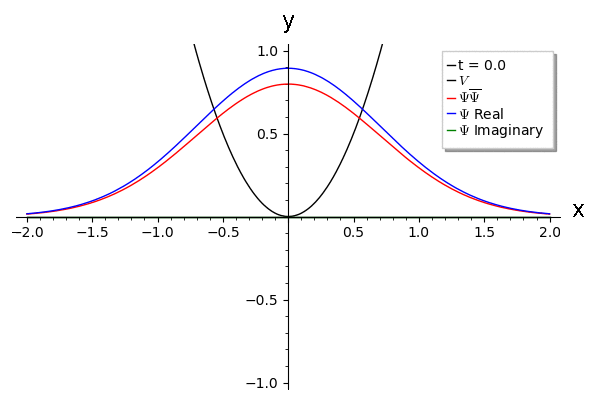

In [121]:
V = var('V')
eqV= V == 2*m*a^2*x^2

t_val = 0
m_val = 1
a_val = 1

#x_marks = [x1,x1-eqs.rhs()(l=l_val), x1+eqs.rhs()(l=l_val)] #markers for mean + or - standard deviation
#x_marks = [float(i) for i in x_marks]
T = animate([plot(0, (-2,2), ymin=-1, ymax=1, legend_label = 't = ' + str(round(t_val,2)), color = 'black') for t_val in sxrange(0,2*constants.pi, .01)])
P = animate([plot(eqV.rhs()(t=t_val, m=m_val, a=a_val, hbar = hbar_val), (x,-2,2), ymax=2, legend_label=r"$%s$"%latex(eqV.lhs()), axes_labels=['x','y'], color='black') for t_val in sxrange(0,2*constants.pi, .01)])#, ticks=[x_marks,None], tick_formatter=[[r"$\langle x\rangle$", r"$\langle x\rangle-\sigma$", r"$\langle x\rangle+\sigma$"], None])
P += animate([plot(sqrt(2*a_val*m_val/(constants.pi)*e^(-2*a_val*m_val*x^2)), (x,-2,2), ymax=2, color = 'red', legend_label=r"$%s$"%latex(eq1.lhs())) for t_val in sxrange(0,2*constants.pi, .01)])
Q = animate([plot((2*a_val*m_val/(constants.pi))^(1/4)*e^(-a_val*m_val*x^2)*cos(-a_val*t_val), (x,-2,2),ymin=-1, ymax=1, color = 'blue', legend_label=r"$%s$"%latex(eq0.lhs()) +  ' Real') for t_val in sxrange(0,2*constants.pi, .01)])
R = animate([plot((2*a_val*m_val/(constants.pi))^(1/4)*e^(-a_val*m_val*x^2)*sin(-a_val*t_val), (x,-2,2),ymin=-1, ymax=1, color = 'green', legend_label=r"$%s$"%latex(eq0.lhs()) + ' Imaginary') for t_val in sxrange(0,2*constants.pi, .01)])
for i in range(len(T)):
    T[i].set_legend_options(loc=1)
(T+P+Q+R).show(delay=2)